<a href="https://colab.research.google.com/github/Nastiiasaenko/Week5-XAI/blob/main/XAI_5.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Local explanation techniques

In this notebook we will explore how to do local explanations for blackbox models.

In this notebook we will use a very popular IMBD dataset for sentiment prediction with a pre-trained BERT model. The pretrained BERT model will predict one of 5 start ratings for the review of the movie. Then we will use SHAP plots to get local explanations for some reviews to try to understand how the model made its decision to assign a label.

### In this notebook we will:

1. **Model setup**:
* We used a pre-trained BERT model (nlptown/bert-base-multilingual-uncased-sentiment) to perform sentiment analysis on a movie review dataset (IMDB).
* The model takes reviews as input, tokenizes them, and makes predictions (e.g., classifying the sentiment as very negative (1 star), negative(2 star), neutral(3 star), positive(4 star), or very positive(5 star)).

2. **Tokenization and prediction**:
* The reviews are split into tokens (words or subwords) using a tokenizer that aligns with the BERT model.
* Each token is then processed by the model to produce predictions.

3. **SHAP (SHapley Additive exPlanations)**:
*SHAP is used to explain how the model made its predictions by assigning importance values (SHAP values) to each token, showing its contribution to the final prediction.
* We used different SHAP plots to explain the model's predictions.


In [94]:
!pip install numpy==1.25.2 pandas==2.0.3 matplotlib==3.7.1 scikit-learn==1.2.2 lime==0.2.0.1 anchor-exp==0.0.2.0 shap==0.45.1


In [95]:
!pip install datasets


### Importing libraries

In [96]:
import shap
import torch
from transformers import BertTokenizer, BertForSequenceClassification
from transformers import pipeline
from datasets import load_dataset


# Model Set up

### First, we download the pretrained BERT model

In [97]:
## load pre-trained bert classificator
model = BertForSequenceClassification.from_pretrained('nlptown/bert-base-multilingual-uncased-sentiment')
tokenizer = BertTokenizer.from_pretrained('nlptown/bert-base-multilingual-uncased-sentiment')

/usr/local/lib/python3.10/dist-packages/transformers/tokenization_utils_base.py:1601: FutureWarning: `clean_up_tokenization_spaces` was not set. It will be set to `True` by default. This behavior will be depracted in transformers v4.45, and will be then set to `False` by default. For more details check this issue: https://github.com/huggingface/transformers/issues/31884
  warnings.warn(


### Let's load the IMBD dataset

We will download the dataset and look at what the review looks like in the dataset

In [98]:
# Step 2: Load the IMDB dataset
imdb_dataset = load_dataset("imdb")
print(imdb_dataset["test"][10]["text"])  # Check some review

This flick is a waste of time.I expect from an action movie to have more than 2 explosions and some shooting.Van Damme's acting is awful. He never was much of an actor, but here it is worse.He was definitely better in his earlier movies. His screenplay part for the whole movie was probably not more than one page of stupid nonsense one liners.The whole dialog in the film is a disaster, same as the plot.The title "The Shepherd" makes no sense. Why didn't they just call it "Border patrol"? The fighting scenes could have been better, but either they weren't able to afford it, or the fighting choreographer was suffering from lack of ideas.This is a cheap low type of action cinema.


**Tokenizing the Input:**

We tokenize the review using the BERT tokenizer to convert the text into token IDs and attention masks required for model input.



In [99]:
def encode_review(review):
    tokens = tokenizer(review, return_tensors='pt', padding=True, truncation=True, max_length=512)
    return tokens['input_ids'], tokens['attention_mask']

Here we will choose a **review_text** that we will use for local explanation later

In [100]:
review_text = imdb_dataset['test'][3]['text']  # Now, review_text is defined
print(f"Review: {review_text}")

Review: STAR RATING: ***** Saturday Night **** Friday Night *** Friday Morning ** Sunday Night * Monday Morning <br /><br />Former New Orleans homicide cop Jack Robideaux (Jean Claude Van Damme) is re-assigned to Columbus, a small but violent town in Mexico to help the police there with their efforts to stop a major heroin smuggling operation into their town. The culprits turn out to be ex-military, lead by former commander Benjamin Meyers (Stephen Lord, otherwise known as Jase from East Enders) who is using a special method he learned in Afghanistan to fight off his opponents. But Jack has a more personal reason for taking him down, that draws the two men into an explosive final showdown where only one will walk away alive.<br /><br />After Until Death, Van Damme appeared to be on a high, showing he could make the best straight to video films in the action market. While that was a far more drama oriented film, with The Shepherd he has returned to the high-kicking, no brainer action th

**This is what the model predicts for our test review text**

In [103]:
# Check the number of classes in the model
num_classes = model.config.num_labels
print(f"The model has {num_classes} possible predicted classes.")
# Define the classes (for this model, it's a 5-star rating system)
class_labels = [f"{i+1} star(s)" for i in range(num_classes)]

# Print each class label
for i, label in enumerate(class_labels):
    print(f"Class {i}: {label}")


The model has 5 possible predicted classes.
Class 0: 1 star(s)
Class 1: 2 star(s)
Class 2: 3 star(s)
Class 3: 4 star(s)
Class 4: 5 star(s)


In [102]:
prediction = classifier(review_text)
print(f"Prediction: {prediction[0]}")

Prediction: {'label': '3 stars', 'score': 0.35845085978507996}


#### Create a shap explainer object

**shap.Explainer** is initialized with the classifier (which wraps the model and tokenizer together via the pipeline).


**SHAP Explainer** works by estimating the contribution of each feature (in this case, each token in the text) to the final prediction made by the model.

**The explainer treats the classifier as a black-box function and uses techniques like sampling perturbations of the input (changing tokens or their embeddings) to see how predictions change, and from that, it estimates SHAP values for each feature.**

#### How Shap prediction works internally

* SHAP uses Shapley values from cooperative game theory, where each token in the input text can be thought of as a "player" contributing to the "game" (the final sentiment prediction).
* By evaluating how the output changes as various combinations of tokens are perturbed or removed, SHAP calculates the marginal contribution of each token to the overall prediction.
* It does this by sampling different subsets of tokens and calculating the model's output for each subset.

In [101]:
classifier = pipeline('sentiment-analysis', model=model, tokenizer=tokenizer, device=0)
explainer = shap.Explainer(classifier)
shap_values = explainer([review_text])

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:28, 28.62s/it]               


## Example Review 1 Local explanation.

## Text Plot
Here we will analyse the first review with the Shap Plot text.
### Interpreting SHAP Text Plot

* **SHAP Text Plot** highlights individual words or tokens in the text and shows their contributions to the prediction.

* If we were predictiong a **binary class**
** Red words push the prediction toward a positive sentiment
** Blue words push the prediction toward a negative sentiment.
** The intensity of the color indicates how strong the contribution is. Stronger colors mean the word had a bigger impact on the prediction.

In our case we have **multi-class** prediction we would interpret the plot as

the SHAP text plot, it will generally focus on the predicted class. It shows how the tokens influenced the model's final predicted class (e.g., positive sentiment).


In [104]:
shap.plots.text(shap_values[0])

## Interpretation of the text plot for the sample review 1.
Here when we hover over a star we can see how words contribute to individual prediction of this class vs other classes.

For the predicted class (3 star) we can see that:

* Red highlights: These are tokens (words or phrases) that increase the probability of a 3-star prediction. These words push the prediction toward the 3-star class.


* Blue highlights: These are tokens that decrease the probability of a 3-star prediction, pushing the review away from the 3-star class.

**For the predicted class we can see that:**

The words that contirbute to predicting the 3-star rating are:
* "since derailed", "dull", "explosive final", "uninspired"

The words that take away from predicting the 3-star rating are:

* Words like "saturday night," "sunday night," "monday morning," "showing he could make the best," "high," "van damme," etc., are highlighted in blue, meaning they reduce the likelihood of the review being rated as 3 stars.

**However** - we can go through other star ratings and see that the same words predict 1st and 2d class but the same words **don't** predict the 4-star and 5-star.

Words like "derailed," "worst film," "dull," "predictable," "uninspired performance," and "bland" are highlighted in red, meaning they contribute to the 1-star prediction. These words reflect negative aspects of the review.
Words like "showing he could make the best," "high," "explosive showdown," and "final showdown" are highlighted in blue, meaning they reduce the likelihood of the review being rated as 1 star.

**In conclusion** we can see that the model accurately predicted the review to be **not good** (not having 4 or 5 star) but the actual 3-star prediciton might be too good for this review and we were able to see that because we can see what tokens also contribute to lower-star ratings in this review. This is consistent with the prediction confidence which we mentioned above which was fairly low (the confidence score was 0.35)


# Shap decision plot

## Interpreting SHAP Decision Plot:

* Decision Plot shows how each token cumulatively affects the model's prediction from the baseline value to the final score.

* Baseline Prediction: The plot starts at the model’s baseline prediction (average output across all reviews).


**Token Contributions:**

* Each word is shown in order of how it moves the prediction away from the baseline.
* Positive SHAP values (to the right of the baseline) indicate tokens that push the prediction toward the predicted class.
* Negative SHAP values (to the left) indicate tokens that push the prediction away from that class.
* The final endpoint shows the model’s prediction for the review.

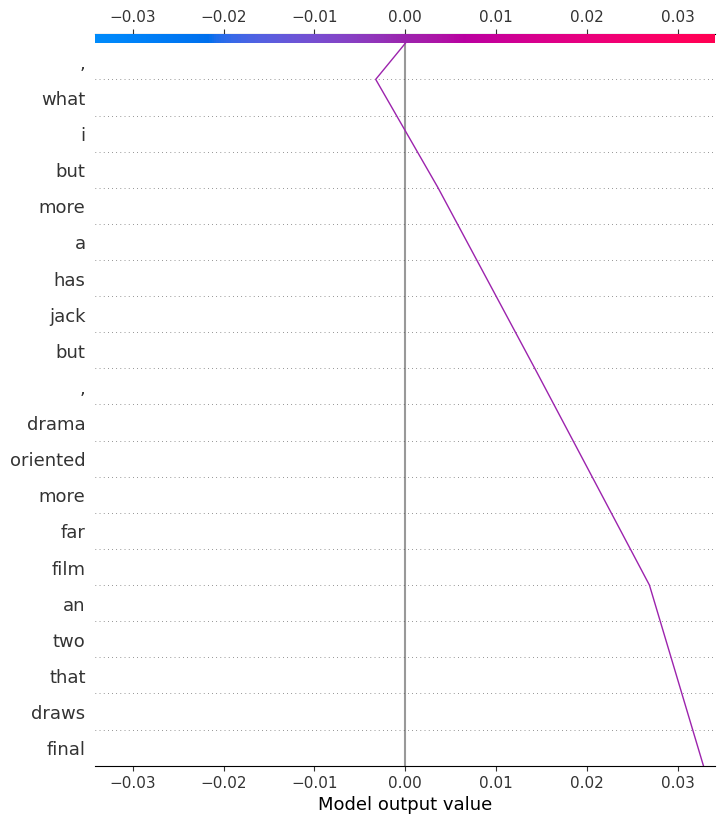

In [105]:
# Ensure SHAP values per token are used instead of summing across classes
inputs = tokenizer(review_text, return_tensors='pt', padding=True, truncation=True, max_length=512)
shap_values_per_token = shap_values[0].values[:, 0]  # Use the SHAP values for one specific output (e.g., first class)

tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])  # Convert token IDs back to tokens


# Check that the length matches
assert len(shap_values_per_token) == len(tokens), "Number of SHAP values and tokens should match!"

# Create the decision plot with SHAP values per token
shap.decision_plot(shap_values[0].base_values[0], shap_values_per_token, feature_names=tokens)

## Interpreting the decision plot for review #1.

Tokens with negative contributions (moving leftward, in blue) reduce the predicted output value. These words are pushing the model's prediction toward a lower sentiment score.
For example, tokens like "what", "i", and "but" move the model's output away from the predicted class.

Tokens with positive contributions (moving rightward, in red) increase the predicted output value, pushing it toward a more positive sentiment.
For example, tokens like "drama", "oriented", and "final" move the prediction toward a more predicted sentiment.



**Now we will go through more examples to test the method**

## Review # 2.

In [106]:
review_text = imdb_dataset['test'][10]['text']
print(f"Review: {review_text}")
prediction = classifier(review_text)
print(f"Prediction: {prediction[0]}")
shap_values = explainer([review_text])
shap.plots.text(shap_values[0])

Review: This flick is a waste of time.I expect from an action movie to have more than 2 explosions and some shooting.Van Damme's acting is awful. He never was much of an actor, but here it is worse.He was definitely better in his earlier movies. His screenplay part for the whole movie was probably not more than one page of stupid nonsense one liners.The whole dialog in the film is a disaster, same as the plot.The title "The Shepherd" makes no sense. Why didn't they just call it "Border patrol"? The fighting scenes could have been better, but either they weren't able to afford it, or the fighting choreographer was suffering from lack of ideas.This is a cheap low type of action cinema.
Prediction: {'label': '1 star', 'score': 0.6542388200759888}


  0%|          | 0/498 [00:00<?, ?it/s]

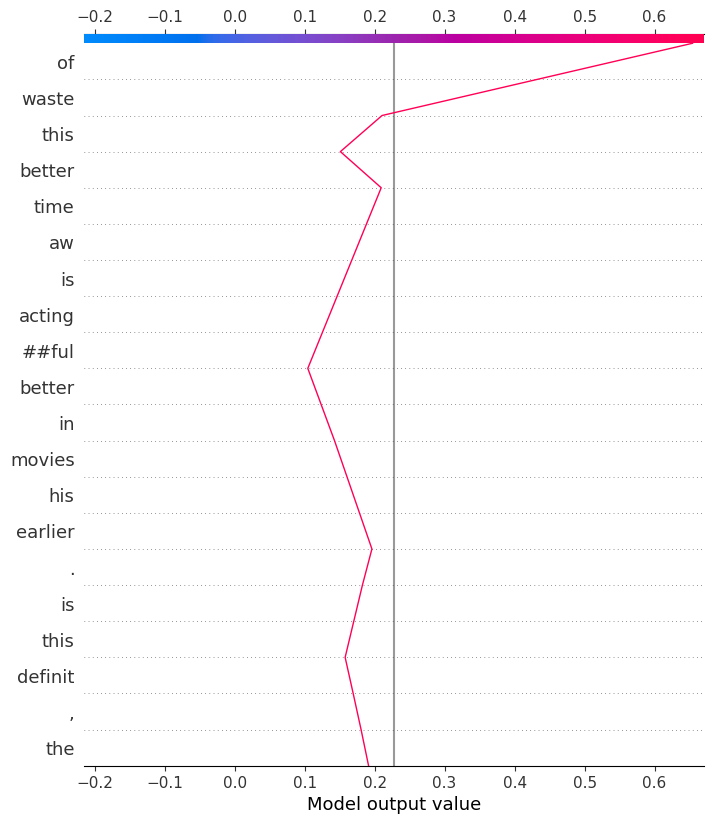

In [107]:
# Ensure SHAP values per token are used instead of summing across classes
inputs = tokenizer(review_text, return_tensors='pt', padding=True, truncation=True, max_length=512)
shap_values_per_token = shap_values[0].values[:, 0]  # Use the SHAP values for one specific output (e.g., first class)

tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])  # Convert token IDs back to tokens


# Check that the length matches
assert len(shap_values_per_token) == len(tokens), "Number of SHAP values and tokens should match!"

# Create the decision plot with SHAP values per token
shap.decision_plot(shap_values[0].base_values[0], shap_values_per_token, feature_names=tokens)

# Review # 3.

In [108]:
review_text = imdb_dataset['test'][90]['text']
print(f"Review: {review_text}")
prediction = classifier(review_text)
print(f"Prediction: {prediction[0]}")
shap_values = explainer([review_text])
shap.plots.text(shap_values[0])

Review: The first 20 minutes were a little fun because I don't think I've seen a film this bad before {acting, script, effects (!), etc....} The rest of the running time seemed to drag forever with every cliche in dialog used to no effect. These people seemed to not really like horror movies or how to make them or any other movie. There's no adult language, a bit of brief nudity, and no gore except fake blood smeared over no open wounds, etc.. It would have been rated PG in the early eighties and PG-13 nowadays. I'm not sure how it got an R rating or if it really did. I saw the American International release titled Hospital Of Terror. I've seen 100 horror films in the past 12 months and this is probably the worst film I've ever seen. Here's an example of how bad it is: There's one scene where something green comes through the door. I'm not sure what it's supposed to be but what it is on screen is some kid's green crayon scribblings {I'm not exaggerating} super-imposed over the film, se

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:11, 11.96s/it]               


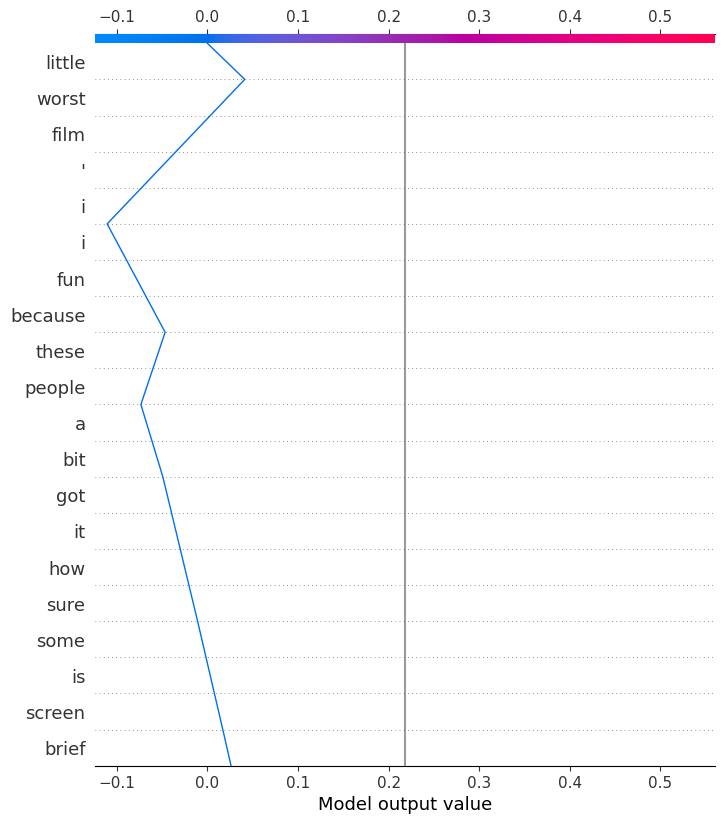

In [109]:
# Ensure SHAP values per token are used instead of summing across classes
inputs = tokenizer(review_text, return_tensors='pt', padding=True, truncation=True, max_length=512)
shap_values_per_token = shap_values[0].values[:, 0]  # Use the SHAP values for one specific output (e.g., first class)

tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])  # Convert token IDs back to tokens


# Check that the length matches
assert len(shap_values_per_token) == len(tokens), "Number of SHAP values and tokens should match!"

# Create the decision plot with SHAP values per token
shap.decision_plot(shap_values[0].base_values[0], shap_values_per_token, feature_names=tokens)

# Review # 3.

In [110]:
review_text = imdb_dataset['test'][15353]['text']
print(f"Review: {review_text}")
prediction = classifier(review_text)
print(f"Prediction: {prediction[0]}")
shap_values = explainer([review_text])
shap.plots.text(shap_values[0])

Review: I was on my way out one morning when I was checking something on the T.V. and came across this film. I don't ever remember seeing this or hearing of it. What a fun and interesting one to watch. Well, my meeting was pushed back, because I couldn't get out of this film. It had some real interesting things in it that marked it's time in history, and some fun things that they don't have people do in today's film because it's not pretty. Well, there was a lot of realism in it. The acting was good for a 1954 film. Subtle and genuine actions on the part of the characters that had me watching what they were going to do next. That is why I ended up watching it. I don't know why they don't show it more often. I would rather watch this than some films they play more than necessary. For history buffs, people who like period films, and those that are in the film appreciation groups will like this one. "The Egyptian" has a variety of flavors dealing with a lot of things to look at in human n

  0%|          | 0/498 [00:00<?, ?it/s]

PartitionExplainer explainer: 2it [00:13, 13.05s/it]               


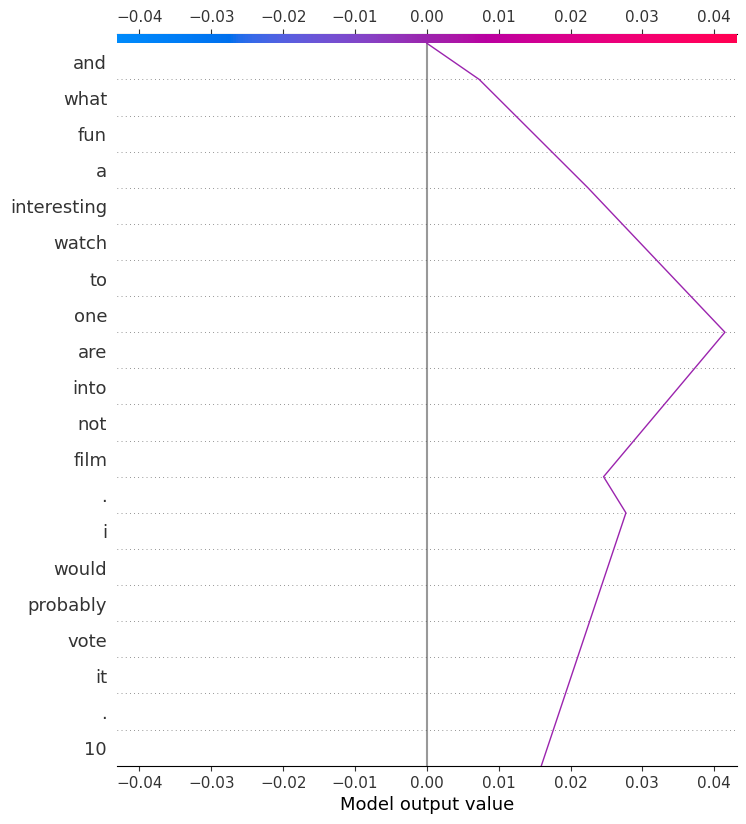

In [111]:
# Ensure SHAP values per token are used instead of summing across classes
inputs = tokenizer(review_text, return_tensors='pt', padding=True, truncation=True, max_length=512)
shap_values_per_token = shap_values[0].values[:, 0]  # Use the SHAP values for one specific output (e.g., first class)

tokens = tokenizer.convert_ids_to_tokens(inputs['input_ids'][0])  # Convert token IDs back to tokens


# Check that the length matches
assert len(shap_values_per_token) == len(tokens), "Number of SHAP values and tokens should match!"

# Create the decision plot with SHAP values per token
shap.decision_plot(shap_values[0].base_values[0], shap_values_per_token, feature_names=tokens)


## Review #3.

In [112]:
review_text = imdb_dataset['test'][21846]['text']
print(f"Review: {review_text}")
prediction = classifier(review_text)
print(f"Prediction: {prediction[0]}")
shap_values = explainer([review_text])
shap.plots.text(shap_values[0])

Review: I thought this movie was absolutely hilarious. I already knew it was going to be a funny movie, but it was funnier than I expected. Sure there were some lame jokes, but they cracked me up. I thought the actors were going to turn out to be pretty bad, but the actors were good in acting out this comedy. I have to give kudos to Amanda Bynes, she looked surprisingly like her brother and pulled off an awesome performance as a boy. As for the other actors, they were funny as well. Of course there were moments where you yell at the screen "how can you not tell?", but that's all part of the fun. In the end the plot turned out pretty well. There's a happy ending, but what'd you expect. <br /><br />Overall,just hilarious.
Prediction: {'label': '4 stars', 'score': 0.5772430896759033}


  0%|          | 0/498 [00:00<?, ?it/s]

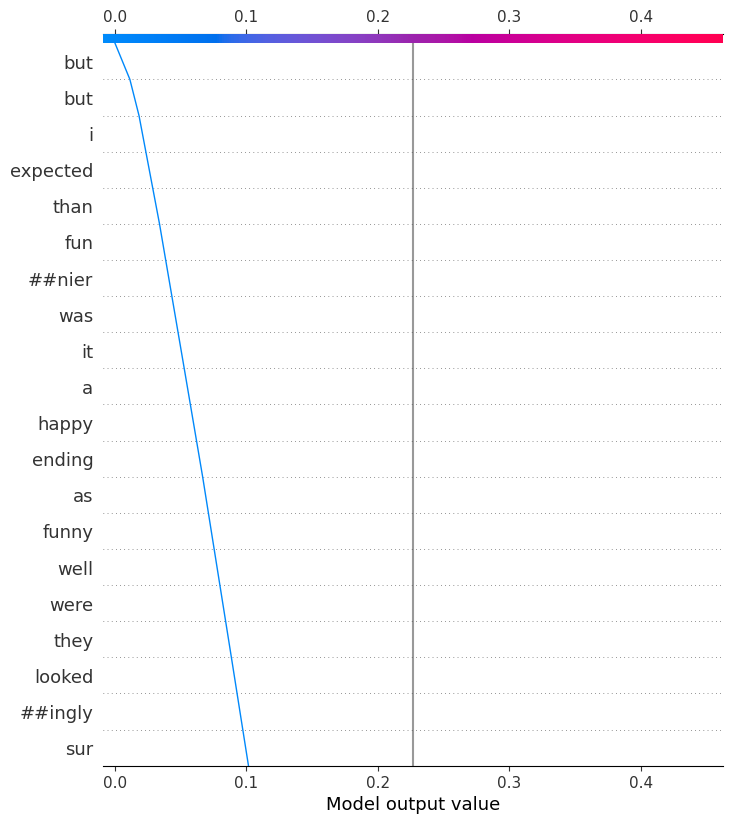

In [114]:
# Ensure SHAP values per token are used instead of summing across classes
shap_values_per_token = shap_values[0].values[:, 0]  # Use the SHAP values for one specific output (e.g., first class)

# Check that the length matches
assert len(shap_values_per_token) == len(tokens), "Number of SHAP values and tokens should match!"

# Create the decision plot with SHAP values per token
shap.decision_plot(shap_values[0].base_values[0], shap_values_per_token, feature_names=tokens)


# Conclusion and discussion on the method choosing

In this analysis, I used SHAP (SHapley Additive exPlanations) to interpret the predictions of a pre-trained BERT-based sentiment analysis model on a movie review dataset. Specifically, I used SHAP text plots and a decision plot to visualize how individual tokens (words or subwords) influenced the model's sentiment predictions.

# Why I Chose SHAP for Explanation
SHAP is a powerful explanation method based on cooperative game theory that provides Shapley values for each feature (token in this case), showing how much each one contributes to the final prediction. I chose SHAP for several reasons:

* Local explanations: SHAP is particularly useful for explaining individual predictions (local explanations). In this case, I wanted to explore how the model arrived at a specific sentiment classification (e.g., a 3-star rating) for a given review.

* SHAP provides intuitive and visually interpretable plots, such as the text plot and the decision plot, which highlight individual words or tokens and how they impact the prediction.

* The text plot shows token-level explanations in a way that’s directly understandable to non-technical users. Words are color-coded based on how they influence the prediction, providing a clear and straightforward explanation.

* SHAP is model-agnostic, meaning it can be used with any machine learning model (like BERT in this case). It applies not only to neural networks but also to decision trees, linear models, and other architectures. This flexibility makes it highly adaptable to a wide range of use cases.

* SHAP ensures that the contribution of each token (feature) is calculated fairly using Shapley values. This means that the tokens are fairly credited or debited based on their actual influence on the prediction.



However, it does have some limitations


* **Computation Complexity** SHAP explanations, especially for deep learning models like BERT, are computationally expensive. Calculating Shapley values involves perturbing the input many times and observing how predictions change, which can be time-consuming for large models and datasets.

* For long reviews, it becomes challenging to interpret the SHAP values for every single token. Text plots and decision plots may become overwhelming if the review has a large number of tokens, leading to difficulty in identifying which features (tokens) are most critical.


## Improvements

* For long reviews, grouping features (tokens) could make the SHAP explanations more digestible. Instead of showing explanations for every individual token, similar tokens could be grouped into meaningful chunks or phrases, which could simplify the interpretation of long reviews.

* In addition to local explanations, I could use global SHAP summaries to show which words tend to be the most influential across the entire dataset. This would give insight into which tokens are the most important drivers of sentiment globally and help identify consistent patterns in model behavior.

* SHAP allows for detecting interactions between features. For instance, some words may only have strong effects when combined with others (e.g., "not good" vs. "good"). Adding interaction plots to explore these relationships could enhance the explanations and give more context to the model's decision-making process.

